In [1]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime

In [19]:
date_end = datetime.date.today()
delta_days = datetime.timedelta(days=31)
delta_amount_days = datetime.timedelta(days=3)

date_start = date_end - delta_days - delta_amount_days
date_end = date_end - delta_days


In [38]:
# Get all the information from curtailments
results = requests.get(f"http://144.39.204.242:11236/charger/T175-IT1-3420-016/profile?start={date_start}&end={date_end}&limit=20000")

In [39]:
# date_end = datetime.date.today()
# delta_days = datetime.timedelta(days=31)
# delta_amount_days = datetime.timedelta(days=3)

date_start = date_end - delta_days - delta_amount_days
date_end = date_end - delta_days
leviton_data = requests.get(f"http://144.39.204.242:11236/evr/leviton/evr?dateStart={date_start}&dateEnd={date_end}&limit=20000")
leviton_data = leviton_data.json()

In [40]:
power_data = []
timestamps_leviton = []
for i in leviton_data['data']:
    power_data.append(i['power'])
    timestamps_leviton.append(i['timestamp'])
print(len(power_data))
print(len(timestamps_leviton))

20000
20000


In [41]:
print(len(power_data))

20000


In [42]:
print(results.json())
data = results.json()['data']

{'data': [{'id': 2341768, 'chargingProfileId': 0, 'stackLevel': 0, 'chargingProfilePurpose': 'TxDefaultProfile', 'chargingProfileKind': 'Absolute', 'chargingSchedule': {'duration': 6000, 'startSchedule': '2023-03-14T05:59:54.242Z', 'chargingRateUnit': 'W', 'chargingSchedulePeriod': [{'startPeriod': 0, 'limit': 59496}]}, 'connectorId': 0, 'handled': False, 'cleared': False, 'accepted': True, 'manualControl': False, 'createdAt': '2023-03-14T05:59:54.242Z', 'updatedAt': '2023-03-14T05:59:54.242Z', 'ChargerId': 'T175-IT1-3420-016'}, {'id': 2341766, 'chargingProfileId': 0, 'stackLevel': 0, 'chargingProfilePurpose': 'TxDefaultProfile', 'chargingProfileKind': 'Absolute', 'chargingSchedule': {'duration': 6000, 'startSchedule': '2023-03-14T05:59:43.430Z', 'chargingRateUnit': 'W', 'chargingSchedulePeriod': [{'startPeriod': 0, 'limit': 59496}]}, 'connectorId': 0, 'handled': False, 'cleared': False, 'accepted': True, 'manualControl': False, 'createdAt': '2023-03-14T05:59:43.431Z', 'updatedAt': '20

In [ ]:
# data = pd.read_csv("Curtailments.csv")

In [62]:
curtailments = []
times = []
for i in data:
    curtailments.append(i["chargingSchedule"]["chargingSchedulePeriod"][0]["limit"] / 1000)
    times.append(i["chargingSchedule"]["startSchedule"])

print(len(curtailments))
print(times)
df = pd.DataFrame()
df["Curtailments (kW)"] = curtailments[10::1000]
df["Timestamp"] = times[10::1000]
df["Power Usage (kW)"] = power_data[:10:-1000]
df.to_csv("Curtailments.csv")

20000
['2023-03-14T05:59:54.242Z', '2023-03-14T05:59:43.430Z', '2023-03-14T05:59:32.558Z', '2023-03-14T05:59:21.839Z', '2023-03-14T05:59:10.890Z', '2023-03-14T05:59:00.022Z', '2023-03-14T05:58:48.433Z', '2023-03-14T05:58:37.488Z', '2023-03-14T05:58:19.536Z', '2023-03-14T05:58:08.632Z', '2023-03-14T05:57:57.872Z', '2023-03-14T05:57:46.982Z', '2023-03-14T05:57:36.197Z', '2023-03-14T05:57:25.287Z', '2023-03-14T05:57:14.421Z', '2023-03-14T05:57:03.577Z', '2023-03-14T05:56:52.777Z', '2023-03-14T05:56:41.872Z', '2023-03-14T05:56:31.085Z', '2023-03-14T05:56:20.280Z', '2023-03-14T05:56:09.415Z', '2023-03-14T05:55:58.368Z', '2023-03-14T05:55:47.383Z', '2023-03-14T05:55:36.549Z', '2023-03-14T05:55:25.137Z', '2023-03-14T05:55:13.428Z', '2023-03-14T05:55:01.252Z', '2023-03-14T05:54:49.716Z', '2023-03-14T05:54:38.735Z', '2023-03-14T05:54:27.777Z', '2023-03-14T05:54:16.941Z', '2023-03-14T05:54:05.993Z', '2023-03-14T05:53:55.111Z', '2023-03-14T05:53:44.299Z', '2023-03-14T05:53:33.450Z', '2023-03-14T0

C:\Users\sonor\AppData\Local\Temp\ipykernel_29540\2956217107.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(list(df['Timestamp'].apply(lambda time : datetime.datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%fZ").strftime('%H:%M'))), rotation=60, fontsize=12)


Text(0.5, 1.0, 'Curtailments and Power Usage at the EVR')

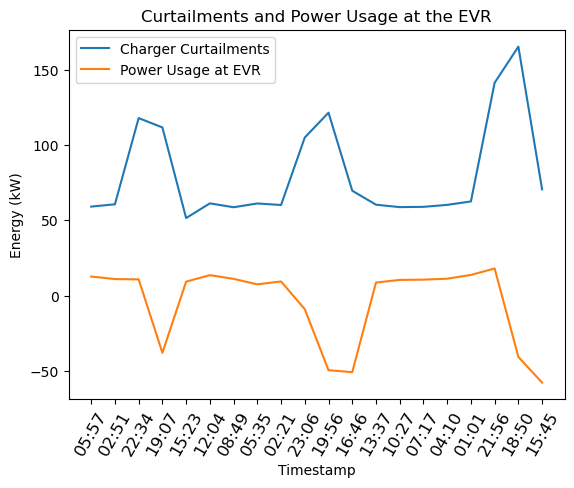

In [63]:
ax = sns.lineplot(x="Timestamp", y="Curtailments (kW)", data=df, label="Charger Curtailments")
sns.lineplot(x="Timestamp", y="Power Usage (kW)", data=df, label="Power Usage at EVR")
ax.set_xticklabels(list(df['Timestamp'].apply(lambda time : datetime.datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%fZ").strftime('%H:%M'))), rotation=60, fontsize=12)
plt.ylabel("Energy (kW)")
plt.title("Curtailments and Power Usage at the EVR")